In [14]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
#           print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

SyntaxError: incomplete input (427275039.py, line 17)

In [15]:
%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from torch.distributions.beta import Beta

In [16]:
opt = {'n_epochs':100,  # Number of epochs to train for
       'batch_size':128,  # Batch size
       'lr':0.0002,  # Learning Rate
       'b1':0.5,  # Adam optimizer beta 1
       'b2':0.999,  # Adam optimizer beta 2
       'latent_dim':100,  # Size of generator input dim
       'img_size':64,  # Image size to produce
       'channels':3,  # Number of channels - 1 for BW, 3 for RGB
       'width':64, # Width of network layer
       }


def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm2d") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)


class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

        self.conv_blocks = nn.Sequential(
            nn.ConvTranspose2d(opt['latent_dim'], opt['width'] * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(opt['width'] * 8),
            nn.ReLU(True),

            nn.ConvTranspose2d(opt['width'] * 8, opt['width'] * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(opt['width'] * 4),
            nn.ReLU(True),

            nn.ConvTranspose2d(opt['width'] * 4, opt['width'] * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(opt['width'] * 2),
            nn.ReLU(True),

            nn.ConvTranspose2d(opt['width'] * 2, opt['width'], 4, 2, 1, bias=False),
            nn.BatchNorm2d(opt['width']),
            nn.ReLU(True),

            nn.ConvTranspose2d(opt['width'], opt['channels'], 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, z):
        img = self.conv_blocks(z)
        return img

    
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.conv_layers = nn.Sequential(

            nn.Conv2d(opt['channels'], opt['width'], 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(opt['width'], opt['width'] * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(opt['width'] * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.2),

            nn.Conv2d(opt['width'] * 2, opt['width'] * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(opt['width'] * 4),
            nn.LeakyReLU(0.2, inplace=True),
#             nn.Dropout2d(0.2),

            nn.Conv2d(opt['width'] * 4, opt['width'] * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(opt['width'] * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.2),

            nn.Conv2d(opt['width'] * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.conv_layers(input)

In [17]:
# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available()) else "cpu")

# Loss function
adversarial_loss = torch.nn.BCELoss().to(device)

# Initialize generator and discriminator
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# Initialize weights
generator.apply(weights_init_normal)
discriminator.apply(weights_init_normal)

# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=opt['lr'], betas=(opt['b1'], opt['b2']))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=opt['lr'], betas=(opt['b1'], opt['b2']))

print(generator)
print(discriminator)

Generator(
  (conv_blocks): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()

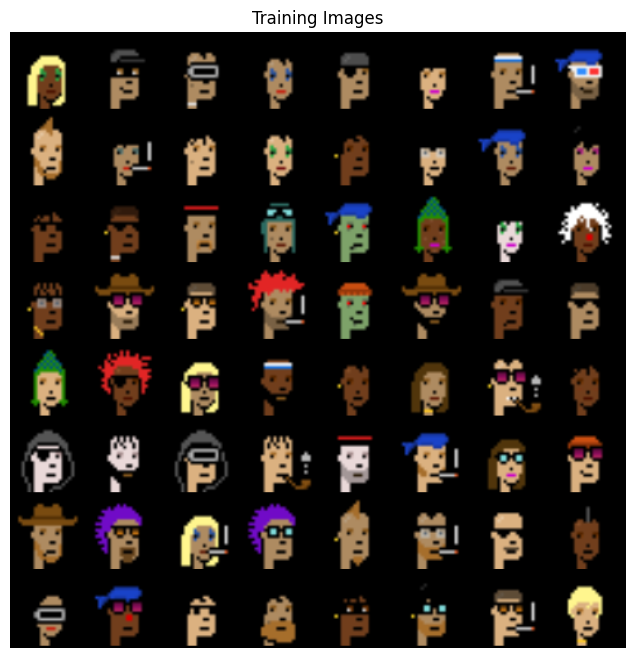

In [18]:
# Root directory for dataset
dataroot = '../input/cryptopunks/'

# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose(
                           [transforms.Resize([opt['img_size'], opt['img_size']]), transforms.ToTensor(), transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])]
                           ))

# Configure data loader
dataloader = torch.utils.data.DataLoader(
    dataset,
    batch_size=opt['batch_size'],
    shuffle=True,
)

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [19]:
# create ramdon noise to test the generator during training
fixed_noise = torch.randn(64, opt['latent_dim'], 1, 1, device=device)

def smooth_label(alpha, beta):
    distribution = Beta(alpha, beta)
    return distribution.sample().item()

alpha_real, beta_real = 2.0, 5.0  
alpha_fake, beta_fake = 5.0, 2.0

# set up the label for real and fake image during training
real_label = smooth_label(alpha_real, beta_real)
fake_label = smooth_label(alpha_fake, beta_fake)

# real_label = 1
# fake_label = 0

In [20]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

# Training
for epoch in range(opt['n_epochs']):
    for i, data in enumerate(dataloader,0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        
        # training with real image
        discriminator.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        
        # Ensure that the output of the discriminator is a one-dimensional tensor, 
        # regardless of the spatial dimension of the original output tensor
        output = discriminator(real_cpu).view(-1)
        errD_real = adversarial_loss(output, label)
        errD_real.backward() # Discriminator's gradients to the backward 

        # training with fake image
        # generate noise based on b_size of real image
        noise = torch.randn(b_size, opt['latent_dim'], 1, 1, device=device)
        fake = generator(noise)
        label.fill_(fake_label)
        
        # discriminate the output from generator, same one-dimensional tensor
        output = discriminator(fake.detach()).view(-1)
        errD_fake = adversarial_loss(output, label)
        errD_fake.backward()
        
        # combine the real and fake batches
        errD = errD_real + errD_fake
        optimizer_D.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        
        generator.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        
        # Generator's loss based on the output
        output = discriminator(fake).view(-1) 
        errG = adversarial_loss(output, label)
        errG.backward()
        optimizer_G.step()

        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f'
                  % (epoch, opt['n_epochs'], i, len(dataloader), errD.item(), errG.item()))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # storing the generator's performence during training
        if (iters % 500 == 0) or ((epoch == opt['n_epochs']-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = generator(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

[0/100][0/79]	Loss_D: 1.6143	Loss_G: 3.3571
[0/100][50/79]	Loss_D: 1.8205	Loss_G: 0.8388
[1/100][0/79]	Loss_D: 1.4938	Loss_G: 2.3661
[1/100][50/79]	Loss_D: 1.3806	Loss_G: 1.4460
[2/100][0/79]	Loss_D: 1.3495	Loss_G: 1.1355
[2/100][50/79]	Loss_D: 1.3426	Loss_G: 1.0452
[3/100][0/79]	Loss_D: 1.6148	Loss_G: 1.8928
[3/100][50/79]	Loss_D: 1.3496	Loss_G: 0.8283
[4/100][0/79]	Loss_D: 1.3110	Loss_G: 0.9681
[4/100][50/79]	Loss_D: 1.3008	Loss_G: 0.8539
[5/100][0/79]	Loss_D: 1.7754	Loss_G: 0.8728
[5/100][50/79]	Loss_D: 1.2930	Loss_G: 0.9008
[6/100][0/79]	Loss_D: 1.4438	Loss_G: 0.7895
[6/100][50/79]	Loss_D: 1.3003	Loss_G: 0.9635
[7/100][0/79]	Loss_D: 1.2938	Loss_G: 1.0879
[7/100][50/79]	Loss_D: 1.3685	Loss_G: 0.7935
[8/100][0/79]	Loss_D: 1.3061	Loss_G: 0.8350
[8/100][50/79]	Loss_D: 1.2916	Loss_G: 1.0499
[9/100][0/79]	Loss_D: 1.2754	Loss_G: 0.9435
[9/100][50/79]	Loss_D: 1.2756	Loss_G: 0.9474
[10/100][0/79]	Loss_D: 1.2951	Loss_G: 1.1517
[10/100][50/79]	Loss_D: 1.3853	Loss_G: 1.0939
[11/100][0/79]	Loss

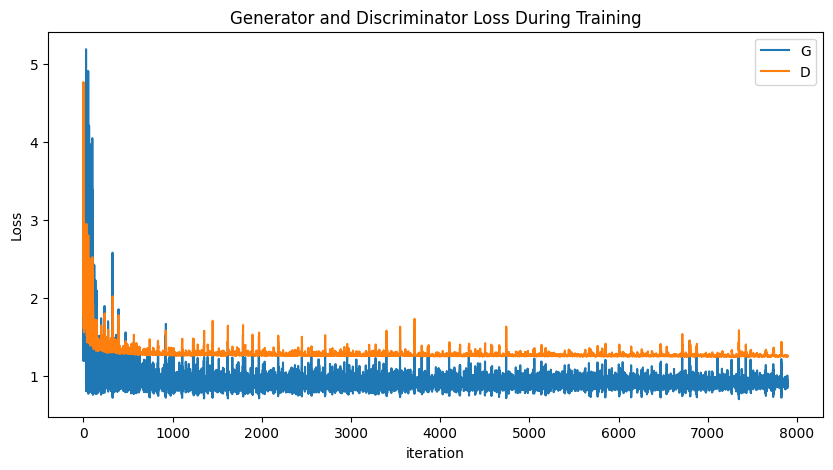

In [21]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iteration")
plt.ylabel("Loss")
plt.legend()
plt.show()

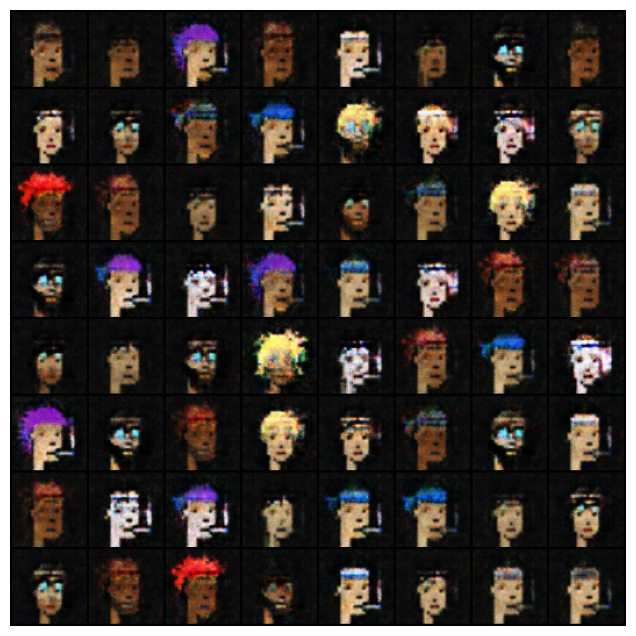

In [22]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list[0:10]]
ani = animation.ArtistAnimation(fig, ims, interval=100, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

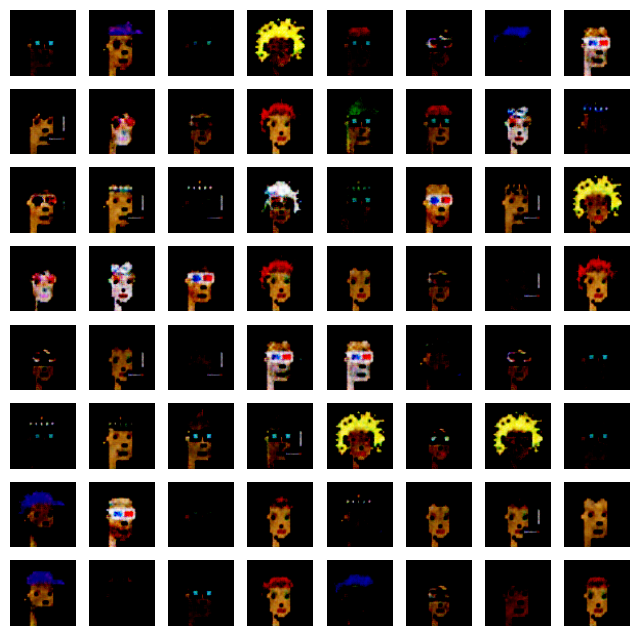

In [24]:
# evalution mode
generator.eval()

# create ramdon noise
batch_size = 64  # 64 images
with torch.no_grad():
    noise = torch.randn(batch_size, opt['latent_dim'], 1, 1, device=device)

# generation 16 images based on some 
generated_images = generator(noise).detach().cpu()

fig, axes = plt.subplots(8, 8, figsize=(8, 8), sharey=True, sharex=True)
for i in range(8):
    for j in range(8):
        axes[i, j].imshow(np.transpose(generated_images[i * 8 + j], (1, 2, 0)))
        axes[i, j].axis('off')

plt.show()